In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip label3.zip

Archive:  label3.zip
   creating: label3/
   creating: label3/im/
  inflating: label3/im/0030910796.jpg  
  inflating: label3/im/0030911231.jpg  
  inflating: label3/im/0030911402.jpg  
  inflating: label3/im/0030911610.jpg  
  inflating: label3/im/0030911833.jpg  
  inflating: label3/im/0030912081.jpg  
  inflating: label3/im/0030912273.jpg  
  inflating: label3/im/0030912406.jpg  
  inflating: label3/im/0030912593.jpg  
  inflating: label3/im/0030912701.jpg  
  inflating: label3/im/0030912906.jpg  
  inflating: label3/im/0030913379.jpg  
  inflating: label3/im/0030913567.jpg  
  inflating: label3/im/0030913742.jpg  
  inflating: label3/im/0030914000.jpg  
  inflating: label3/im/0030914564.jpg  
  inflating: label3/im/0030914842.jpg  
  inflating: label3/trainval.json    


In [ ]:
# install dependencies: 
!pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.8.1+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.8)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
import torch
assert torch.__version__.startswith("1.8")   # need to manually install torch 1.8 if Colab changes its default version
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset1", {}, "/content/drive/MyDrive/TRAINVAL.json", "/content/drive/MyDrive/IMAGES/IMAGES")
# register_coco_instances("my_dataset_V", {}, "trainval.json", "path/DATA")

In [ ]:
Sample_metadata =MetadataCatalog.get("my_dataset1")
Dataset_dicts=DatasetCatalog.get("my_dataset1")

WARNING [05/27 07:05:36 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/27 07:05:36 d2.data.datasets.coco]: Loaded 80 images in COCO format from /content/drive/MyDrive/TRAINVAL.json


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset1",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/27 09:43:30 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[05/27 09:43:31 d2.engine.train_loop]: Starting training from iteration 0
[05/27 09:43:41 d2.utils.events]:  eta: 0:02:15  iter: 19  total_loss: 1.769  loss_cls: 0.7801  loss_box_reg: 0.2692  loss_mask: 0.6898  loss_rpn_cls: 0.006364  loss_rpn_loc: 0.0121  time: 0.4798  data_time: 0.0136  lr: 4.9953e-06  max_mem: 2574M
[05/27 09:43:50 d2.utils.events]:  eta: 0:02:06  iter: 39  total_loss: 1.667  loss_cls: 0.6864  loss_box_reg: 0.3299  loss_mask: 0.6704  loss_rpn_cls: 0.007031  loss_rpn_loc: 0.01035  time: 0.4862  data_time: 0.0064  lr: 9.9902e-06  max_mem: 2574M
[05/27 09:44:00 d2.utils.events]:  eta: 0:01:57  iter: 59  total_loss: 1.463  loss_cls: 0.4987  loss_box_reg: 0.319  loss_mask: 0.6323  loss_rpn_cls: 0.008618  loss_rpn_loc: 0.009543  time: 0.4901  data_time: 0.0052  lr: 1.4985e-05  max_mem: 2574M
[05/27 09:44:10 d2.utils.events]:  eta: 0:01:48  iter: 79  total_loss: 1.223  loss_cls: 0.3668  loss_box_reg: 0.244  loss_mask: 0.578  loss_rpn_cls: 0.006292  loss_rpn_loc: 0.01015  t

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8
cfg.DATASETS.TEST = ("my_dataset1", )
predictor1 = DefaultPredictor(cfg)

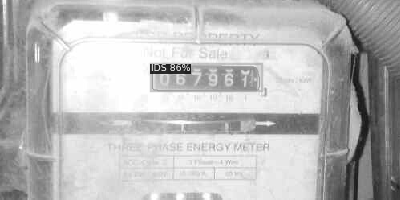

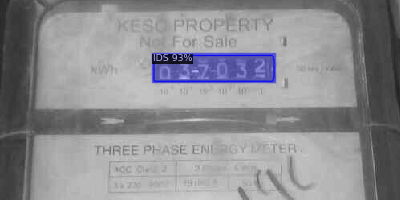

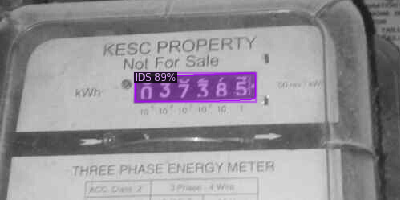

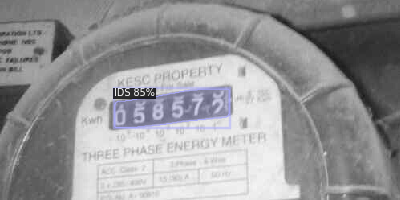

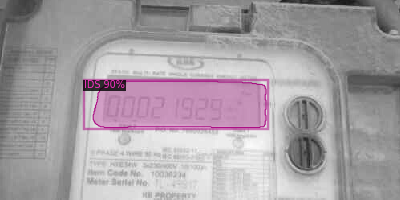

...

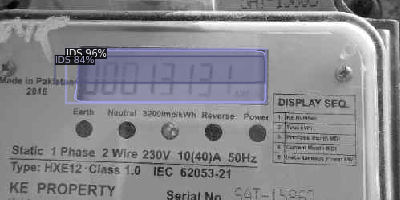

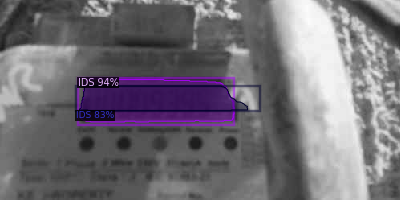

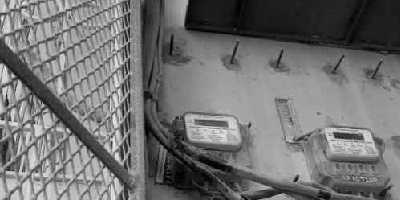

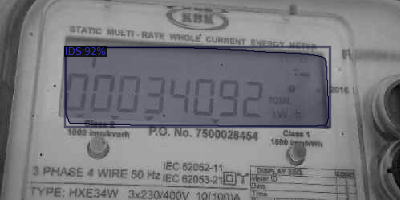

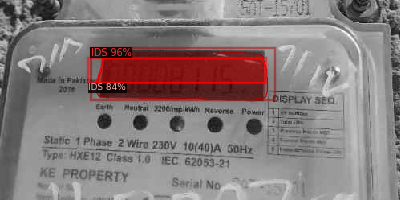

In [ ]:
from detectron2.utils.visualizer import ColorMode
# dataset_dicts =("/content/drive/My Drive/TEST")
# for d in random.sample(dataset_dicts,4):    

import glob
for img in glob.glob("/content/drive/MyDrive/DATASET/test2/*.jpg"):
    cv_img = cv2.imread(img)  
    outputs1 = predictor1(cv_img)
    v1 = Visualizer(cv_img[:, :, ::-1],
               metadata=MetadataCatalog.get("my_dataset1"),
               scale=0.8, 
               instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
               )
    v1 = v1.draw_instance_predictions(outputs1["instances"].to("cpu"))
    cv2_imshow(v1.get_image()[:, :, ::-1])

In [ ]:
print(LCD)

Boxes(tensor([[123.6861,  62.6293, 332.6641, 127.9969]], device='cuda:0'))


In [ ]:
from PIL import Image # import pillow library (can install with "pip install pillow")
# imC = Image.open('/content/0032533096.jpg')
imC = LCD
imC = imC.crop( LCD ) # previously, image was 826 pixels wide, cropping to 825 pixels wide
imC.save('lcd.jpg') # saves the image
imC.show()

AttributeError: ignored

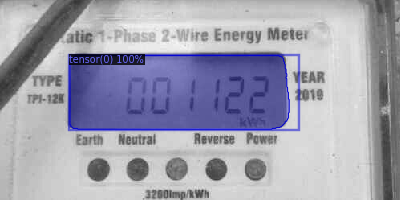

In [ ]:
imge ="/content/0032533096.jpg"
from detectron2.utils.visualizer import ColorMode
imL = cv2.imread(imge)
outputs = predictor(imL)
v = Visualizer(imL[:, :, ::-1],
               metadata=MetadataCatalog.get("my_dataset2"),
               scale=0.8, 
               instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
from detectron2.utils.visualizer import ColorMode
# dataset_dicts =("/content/drive/My Drive/TEST")
# for d in random.sample(dataset_dicts,4):    

import glob
for img in glob.glob("/content/drive/MyDrive/DATASET/test2/*.jpg"):
    cv_img = cv2.imread(img)  
    outputs = predictor(cv_img)
    v = Visualizer(cv_img[:, :, ::-1],
               metadata=MetadataCatalog.get("my_dataset1"),
               scale=0.8, 
               instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
               )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    LCD = outputs["instances"].pred_boxes.tensor.cpu().numpy()

    # cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
pp =outputs["instances"].pred_boxes.tensor.cpu().numpy()
LCD[0][0]

123.68606

In [ ]:
# type(pp)

p =LCD[0][0]
p
# p1 =outputs["instances"].pred_boxes.tensor.cpu().numpy()
# # type(p)
# # list2 =[]
# # list2 =p
# ppp =pp.tolist()
# ppp

123.68606

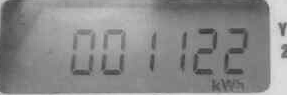

In [ ]:
from PIL import Image # import pillow library (can install with "pip install pillow")
imC = Image.open(imge)
imC = imC.crop( (pp[0][0],  pp[0][1], pp[0][2], pp[0][3]) ) # previously, image was 826 pixels wide, cropping to 825 pixels wide
imC.save('lcd2.jpg') # saves the image
# imC.show() # opens the image
imC

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset3", {}, "/content/label3/trainval.json", "/content/label3/im")
# register_coco_instances("my_dataset_V", {}, "trainval.json", "path/DATA")

In [ ]:
Sample_metadata =MetadataCatalog.get("my_dataset3")
# .thing_classes = ["0","1","2","3","4","5","6","7","8","9"]

Dataset_dicts=DatasetCatalog.get("my_dataset3")
# MetadataCatalog.get("my_dataset").thing_classes = ["person", "dog"]

# print(my_dataset1)

WARNING [05/27 09:20:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/27 09:20:31 d2.data.datasets.coco]: Loaded 17 images in COCO format from /content/label3/trainval.json


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset3",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 700    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/27 09:56:29 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (11, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (11,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (40, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (40,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (10, 256, 1, 

[05/27 09:56:29 d2.engine.train_loop]: Starting training from iteration 0
[05/27 09:56:39 d2.utils.events]:  eta: 0:05:39  iter: 19  total_loss: 4.262  loss_cls: 2.471  loss_box_reg: 0.5326  loss_mask: 0.693  loss_rpn_cls: 0.529  loss_rpn_loc: 0.0353  time: 0.4989  data_time: 0.0147  lr: 4.9953e-06  max_mem: 2745M
[05/27 09:56:50 d2.utils.events]:  eta: 0:05:38  iter: 39  total_loss: 4.132  loss_cls: 2.329  loss_box_reg: 0.6532  loss_mask: 0.6909  loss_rpn_cls: 0.3979  loss_rpn_loc: 0.03861  time: 0.5083  data_time: 0.0066  lr: 9.9902e-06  max_mem: 2745M
[05/27 09:57:00 d2.utils.events]:  eta: 0:05:30  iter: 59  total_loss: 3.77  loss_cls: 2.057  loss_box_reg: 0.8194  loss_mask: 0.6871  loss_rpn_cls: 0.1852  loss_rpn_loc: 0.03542  time: 0.5116  data_time: 0.0061  lr: 1.4985e-05  max_mem: 2745M
[05/27 09:57:10 d2.utils.events]:  eta: 0:05:19  iter: 79  total_loss: 3.385  loss_cls: 1.755  loss_box_reg: 0.8535  loss_mask: 0.6818  loss_rpn_cls: 0.08832  loss_rpn_loc: 0.03309  time: 0.5119 

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6
cfg.DATASETS.TEST = ("my_dataset3", )
predictor2 = DefaultPredictor(cfg)

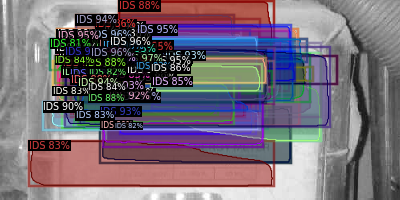

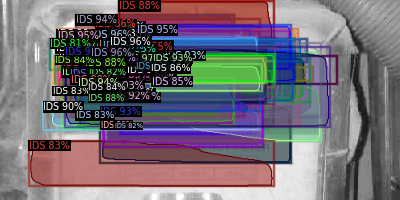

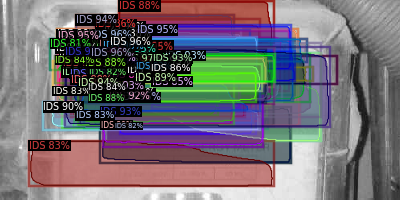

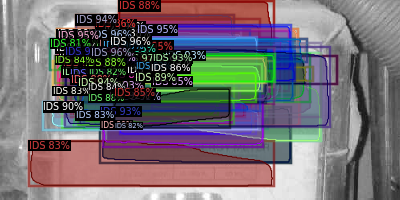

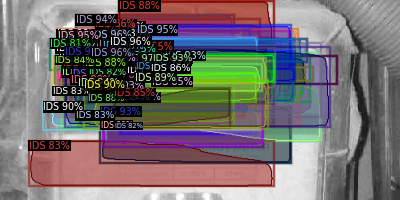

...

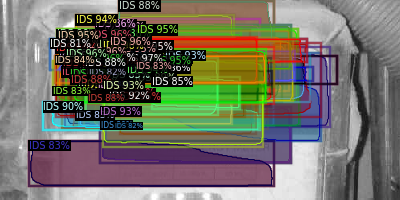

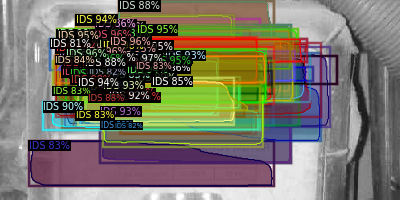

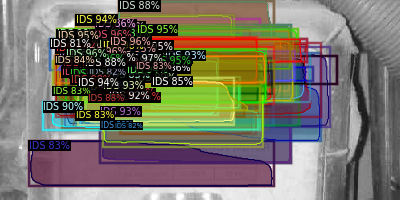

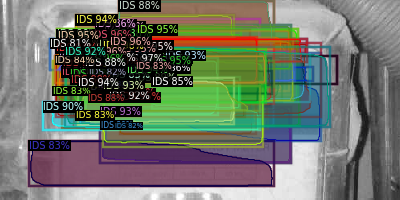

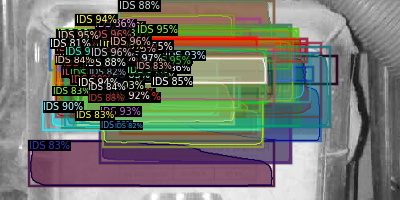

In [ ]:
# from detectron2.utils.visualizer import ColorMode
# dataset_dicts =("/content/drive/My Drive/TEST")
# for d in random.sample(dataset_dicts,4):    

from detectron2.utils.visualizer import ColorMode
# dataset_dicts =("/content/drive/My Drive/TEST")
# for d in random.sample(dataset_dicts,4):    

import glob
for img in glob.glob("/content/drive/MyDrive/DATASET/test2/*.jpg"):
    cv_img = cv2.imread(img)  
    outputs1 = predictor1(cv_img)
    v1 = Visualizer(cv_img[:, :, ::-1],
               metadata=MetadataCatalog.get("my_dataset1"),
               scale=0.8, 
               instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
               )
    v1 = v.draw_instance_predictions(outputs1["instances"].to("cpu"))
    cv2_imshow(v1.get_image()[:, :, ::-1])

# ///////
# import glob
# for img in glob.glob("/content/drive/MyDrive/DATASET/test2/*.jpg"):
#     cv_img = cv2.imread(img)  
#     outputs = predictor(cv_img)
#     v = Visualizer(cv_img[:, :, ::-1],
#                metadata=MetadataCatalog.get("my_dataset1"),
#                scale=0.8, 
#                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
#                )
#     v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
#     pp = outputs["instances"].pred_boxes.tensor.cpu().numpy()
#     imC = Image.open(img)
    # imC
    # imC = imC.crop( (pp[0][0],  pp[0][1], pp[0][2], pp[0][3]) )

    # im = cv2.imread(imC)
    # outputs = predictor(im)
    # v = Visualizer(im[:, :, ::-1],
    #            metadata=MetadataCatalog.get("my_dataset0"),
    #            scale=0.8, 
    #            instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    # )
    # v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    # cv2_imshow(v.get_image()[:, :, ::-1])

    # cv2_imshow(v.get_image()[:, :, ::-1])



# /////////////////////////
# from PIL import Image # import pillow library (can install with "pip install pillow")
# imC = Image.open(imge)
# imC = imC.crop( (pp[0][0],  pp[0][1], pp[0][2], pp[0][3]) ) # previously, image was 826 pixels wide, cropping to 825 pixels wide
# imC.save('lcd2.jpg') # saves the image
# # imC.show() # opens the image
# imC


# ////////////////////////

# imge = "/content/lcd.jpg"
# from detectron2.utils.visualizer import ColorMode
# im = cv2.imread(imge)
# outputs = predictor(im)
# v = Visualizer(im[:, :, ::-1],
#                metadata=MetadataCatalog.get("my_dataset0"),
#                scale=0.8, 
#                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
# )
# v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
# cv2_imshow(v.get_image()[:, :, ::-1])

#     # cv2_imshow(v.get_image()[:, :, ::-1])

[[111.234535   9.26343  369.413     98.39815 ]]


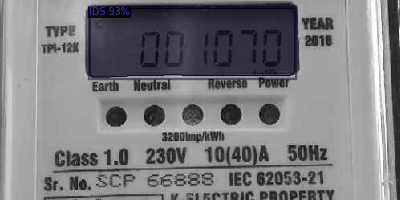

[[111.31757   23.146734 351.29086  103.733246]]


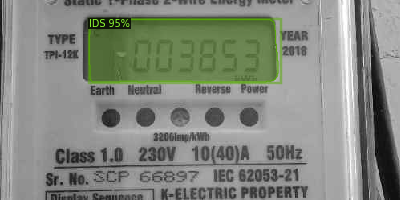

[[1.03443596e+02 3.98478597e-01 3.98930847e+02 7.23115540e+01]]


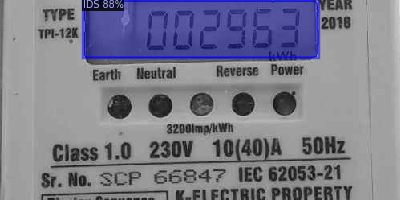

[[125.304276  32.550644 342.03275  105.02378 ]]


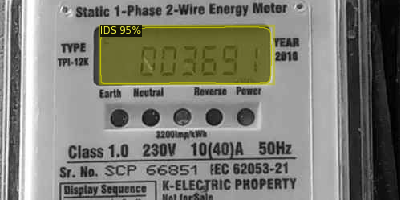

[[141.9037   64.31141 285.90524 123.19421]]


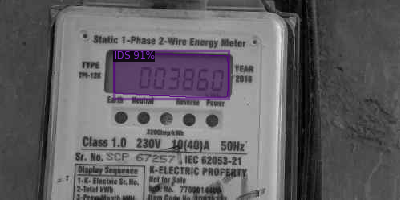

[[102.97099   11.952754 380.31552   97.76102 ]]


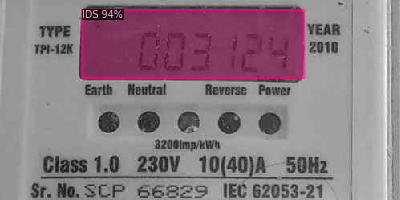

[[127.07071  19.51031 411.12888  91.06057]]


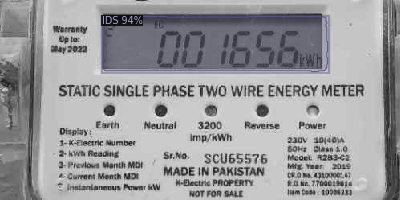

[[126.47823   37.52055  342.6914   109.642075]]


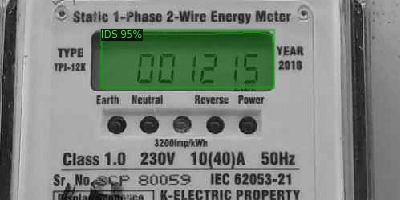

[[141.30678  40.11298 345.8263  105.60275]
 [141.9789   59.31398 343.56494  92.15726]]


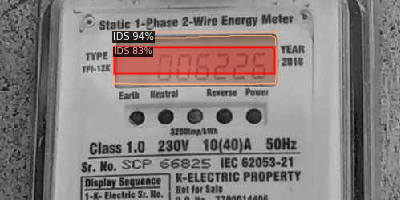

[[149.18706   46.001537 366.90903  111.4498  ]
 [132.46017   59.071716 397.35678   93.229004]]


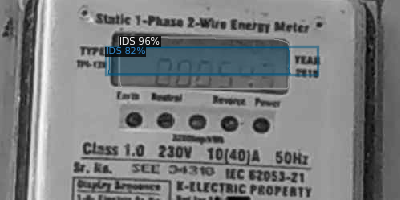

[[118.62827   24.825024 353.05963  101.391846]]


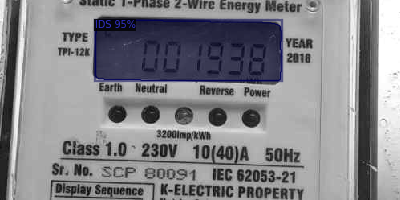

[[ 90.55269   11.245576 358.17734  102.296684]]


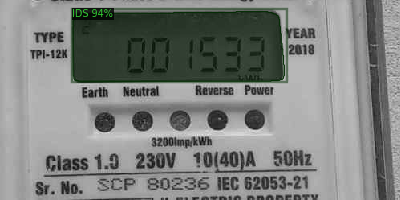

[[114.48645   34.901073 356.28928  120.67862 ]]


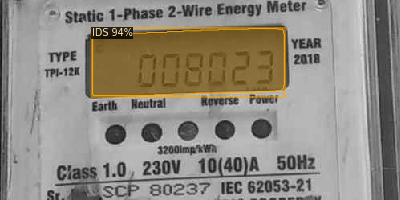

[[ 95.19478    18.367548  338.55237    92.62983  ]
 [ 94.62778    47.264954  351.96414    81.77775  ]
 [ 85.64522     4.9225783 430.08807   110.33891  ]]


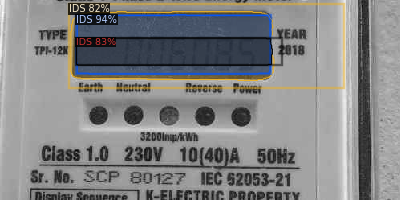

[]


IndexError: ignored

In [ ]:
from detectron2.utils.visualizer import ColorMode
# dataset_dicts =("/content/drive/My Drive/TEST")
# for d in random.sample(dataset_dicts,4):    
from PIL import Image # import pillow library (can install with "pip install pillow")

import glob
for img in glob.glob("/content/drive/MyDrive/DATASET/test5/*.jpg"):
    cv_img = cv2.imread(img)  
    outputs1 = predictor1(cv_img)
    v1 = Visualizer(cv_img[:, :, ::-1],
               metadata=MetadataCatalog.get("my_dataset1"),
               scale=0.8, 
               instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
               )
    v1 = v1.draw_instance_predictions(outputs1["instances"].to("cpu"))
    pp = outputs1["instances"].pred_boxes.tensor.cpu().numpy()


    print(pp)



    imC = Image.open(img)
    imC = imC.crop( (pp[0][0],  pp[0][1], pp[0][2], pp[0][3]) )

    







    # outputs1 = predictor1(cv_img)
    # v1 = Visualizer(cv_img[:, :, ::-1],
    #            metadata=MetadataCatalog.get("my_dataset1"),
    #            scale=0.8, 
    #            instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    #            )
    # v1 = v1.draw_instance_predictions(outputs1["instances"].to("cpu"))
    

    cv2_imshow(v1.get_image()[:, :, ::-1])

In [ ]:
from PIL import Image # import pillow library (can install with "pip install pillow")
imC = Image.open(cv_img)
imC = imC.crop( (pp[0][0],  pp[0][1], pp[0][2], pp[0][3]) ) # previously, image was 826 pixels wide, cropping to 825 pixels wide
imC.save('lcd2.jpg') # saves the image
# imC.show() # opens the image
imC